<a href="https://colab.research.google.com/github/kelompok1-Alpro/Laporan-Alpro/blob/main/hasil_prediksi_waktuh_tempuh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install xgboost openpyxl

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor


In [ ]:
file_path = '/content/drive/MyDrive/PrediksiWaktu/dataset_perjalanan.xlsx'
df = pd.read_excel(file_path)
df.head()

,Cuaca,Kepadatan,Jam_Berangkat,Persimpangan,Ada_Perbaikan_Jalan,Hari,Tanjakan,Klasifikasi_Tanjakan,Tanjakan_Kecil,Tanjakan_Sedang,...,Turunan_Besar,Tanjakan_Turunan,Jumlah_Berhenti,Jarak_KM,Kecepatan_Rata2,Lokasi_Asal,Koordinat_Asal,Koordinat_Tujuan,Lokasi_Tujuan,Waktu_Tempuh
0,Berawan,Rendah,12,10,Tidak,Kamis,0,Tanjakan Kecil,0,0,...,0,5,10.0,9.805493,30.541744,RSUD Sele Be Solu,"(-0.9115, 131.32)","(-0.873, 131.25)",Universitas Pendidikan Muhammadiyah Sorong,14.708240
1,Hujan,Sedang,6,8,Tidak,Sabtu,6,Tanjakan Besar,2,2,...,0,9,8.0,11.357586,26.276157,Kantor Bupati Kabupaten Sorong,"(-0.873, 131.25)","(-0.9015, 131.2295)",Stadion Wombik,17.036379
2,Berawan,Padat,14,7,Ya,Rabu,6,Tanjakan Besar,2,2,...,0,10,8.0,11.878944,23.176607,Kantor Bupati Kabupaten Sorong,"(-0.873, 131.25)","(-0.9075, 131.2341)",Kantor Walikota kota sorong,17.818416
3,Cerah,Sedang,15,9,Tidak,Kamis,6,Tanjakan Besar,2,2,...,2,10,1.0,13.985191,34.936618,Bandara Domine Eduard Osok,"(-0.89417, 131.28889)","(-0.9015, 131.2295)",SPBU Aimas 85.984.03,20.977786
4,Cerah,Rendah,5,15,Tidak,Minggu,6,Tanjakan Besar,2,2,...,0,10,4.0,23.555732,37.903114,Universitas Muhammadiyah Sorong,"(-0.89417, 131.28889)","(-0.9045, 131.2368)",Universitas Pendidikan Muhammadiyah Sorong,35.333599


In [ ]:
data = df.copy()

features = [
    'Cuaca', 'Kepadatan', 'Jam_Berangkat', 'Persimpangan',
    'Ada_Perbaikan_Jalan', 'Hari',
    'Tanjakan_Kecil', 'Tanjakan_Sedang', 'Tanjakan_Besar',
    'Turunan_Kecil', 'Turunan_Sedang', 'Turunan_Besar',
    'Tanjakan_Turunan', 'Jumlah_Berhenti', 'Jarak_KM'
]
target = 'Waktu_Tempuh'

categorical = ['Cuaca', 'Kepadatan', 'Ada_Perbaikan_Jalan', 'Hari']
le_dict = {}
for col in categorical:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    le_dict[col] = le

In [ ]:
X = data[features]
y = data[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)


In [ ]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("=== Evaluasi Model XGBoost ===")
print(f"MAE               : {mae:.2f} menit")
print(f"RMSE              : {rmse:.2f} menit")


=== Evaluasi Model XGBoost ===
MAE               : 0.88 menit
RMSE              : 1.59 menit


In [ ]:
import xgboost as xgb

model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

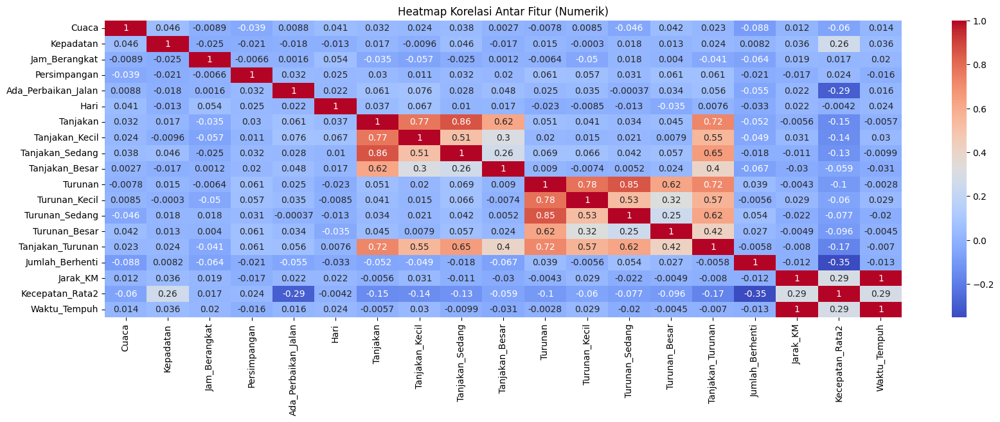

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

df_numeric_for_corr = data.select_dtypes(include=np.number)

if df_numeric_for_corr.empty:
    print("Warning: No numeric columns found in data for correlation heatmap.")
else:
    plt.figure(figsize=(20, 6))
    correlation_matrix = df_numeric_for_corr.corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title("Heatmap Korelasi Antar Fitur (Numerik)")
    plt.show()

/tmp/ipython-input-9-3120308998.py:40: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


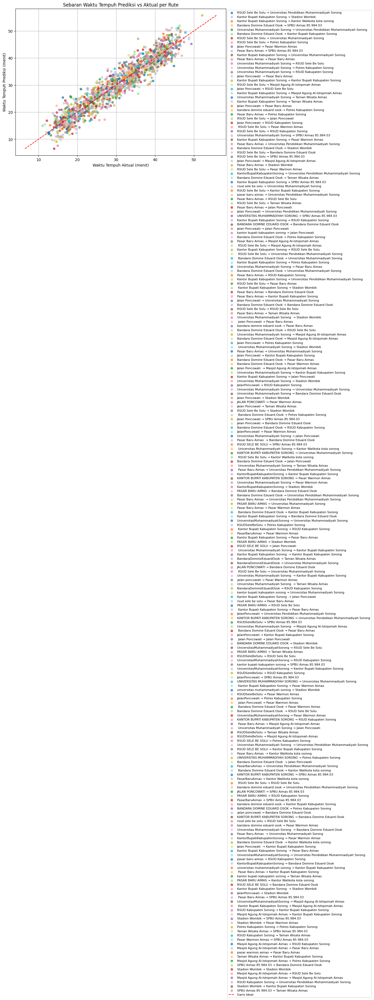

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Buat prediksi simulasi (jika belum ada kolom prediksi asli)
np.random.seed(42)
df['Prediksi'] = df['Waktu_Tempuh'] + np.random.normal(0, 3, len(df))

# Gabungkan asal dan tujuan jadi satu rute
df['Rute'] = df['Lokasi_Asal'] + ' → ' + df['Lokasi_Tujuan']

# Buat plot
plt.figure(figsize=(10, 7))

# Warna otomatis untuk tiap rute
unique_routes = df['Rute'].unique()
colors = plt.cm.tab20.colors  # maksimal 20 warna berbeda
;
for i, rute in enumerate(unique_routes):
    subset = df[df['Rute'] == rute]
    plt.scatter(
        subset['Waktu_Tempuh'],
        subset['Prediksi'],
        label=rute,
        alpha=0.7,
        s=30,
        color=colors[i % len(colors)]
    )

# Garis ideal
min_val = min(df['Waktu_Tempuh'].min(), df['Prediksi'].min())
max_val = max(df['Waktu_Tempuh'].max(), df['Prediksi'].max())
plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Garis Ideal')

# Label
plt.title('Sebaran Waktu Tempuh Prediksi vs Aktual per Rute')
plt.xlabel('Waktu Tempuh Aktual (menit)')
plt.ylabel('Waktu Tempuh Prediksi (menit)')
plt.legend(fontsize=8, loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.tight_layout()
plt.show()


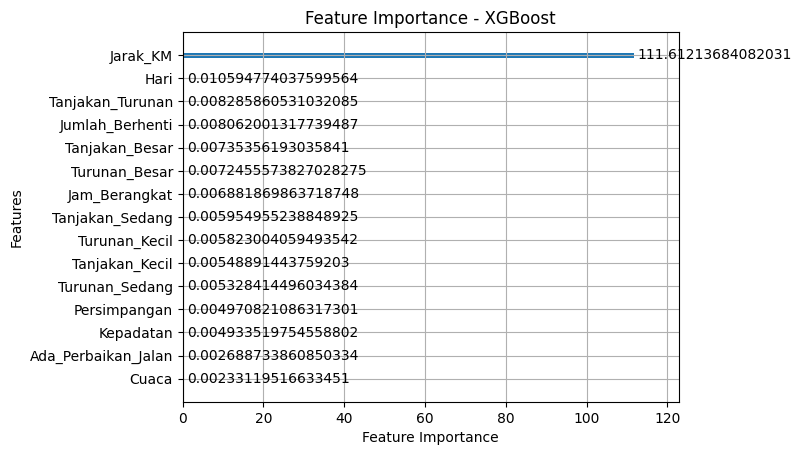

In [ ]:
xgb.plot_importance(model, importance_type='gain', xlabel='Feature Importance')
plt.title('Feature Importance - XGBoost')
plt.show()


In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

y_pred = ridge_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R² Ridge:", round(r2, 4))


R² Ridge: 0.97


/tmp/ipython-input-12-2334227534.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Rute', y='Waktu_Tempuh', data=df, palette='Set2')


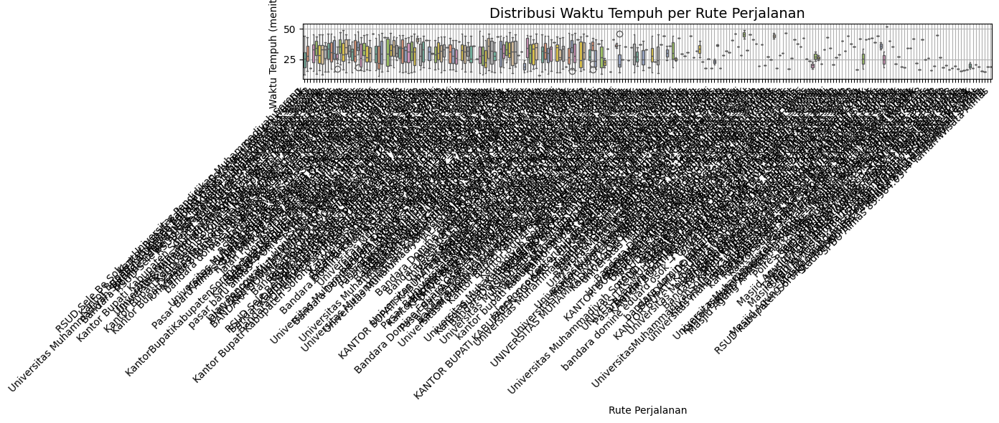

In [ ]:

# Buat kolom Rute: Asal → Tujuan
df['Rute'] = df['Lokasi_Asal'] + ' → ' + df['Lokasi_Tujuan']

# Buat boxplot berdasarkan rute
plt.figure(figsize=(14, 6))
sns.boxplot(x='Rute', y='Waktu_Tempuh', data=df, palette='Set2')

plt.title('Distribusi Waktu Tempuh per Rute Perjalanan', fontsize=14)
plt.xlabel('Rute Perjalanan')
plt.ylabel('Waktu Tempuh (menit)')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
print(df.isnull().sum())

Cuaca                   0
Kepadatan               0
Jam_Berangkat           0
Persimpangan            0
Ada_Perbaikan_Jalan     0
Hari                    0
Tanjakan                0
Klasifikasi_Tanjakan    0
Tanjakan_Kecil          0
Tanjakan_Sedang         0
Tanjakan_Besar          0
Turunan                 0
Klasifikasi_Turunan     0
Turunan_Kecil           0
Turunan_Sedang          0
Turunan_Besar           0
Tanjakan_Turunan        0
Jumlah_Berhenti         0
Jarak_KM                0
Kecepatan_Rata2         0
Lokasi_Asal             0
Koordinat_Asal          0
Koordinat_Tujuan        0
Lokasi_Tujuan           0
Waktu_Tempuh            0
Prediksi                0
Rute                    0
dtype: int64


In [ ]:
print("Jumlah duplikat:", df.duplicated().sum())

Jumlah duplikat: 0


In [ ]:
df = df.drop_duplicates()

In [ ]:
df['Rute'] = df['Lokasi_Asal'] + ' → ' + df['Lokasi_Tujuan']

g = sns.displot(
    data=df,
    x='Waktu_Tempuh',
    col='Rute',
    col_wrap=4,
    kde=True,
    bins=15,
    color='skyblue',
    facet_kws={'sharex': False, 'sharey': False}
)

g.fig.subplots_adjust(top=0.94)
g.fig.suptitle('Distribusi Waktu Tempuh per Rute (Semua Rute)', fontsize=16)
plt.show()


Kolom numerik (16): ['Jam_Berangkat', 'Persimpangan', 'Tanjakan', 'Tanjakan_Kecil', 'Tanjakan_Sedang', 'Tanjakan_Besar', 'Turunan', 'Turunan_Kecil', 'Turunan_Sedang', 'Turunan_Besar', 'Tanjakan_Turunan', 'Jumlah_Berhenti', 'Jarak_KM', 'Kecepatan_Rata2', 'Waktu_Tempuh', 'Prediksi']


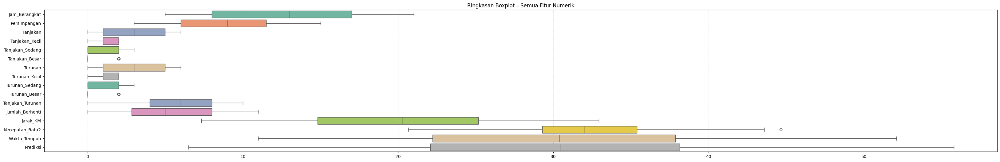

Total rute unik: 187


/tmp/ipython-input-17-2488750622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Rute', y=col, data=df, palette='pastel')
/tmp/ipython-input-17-2488750622.py:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


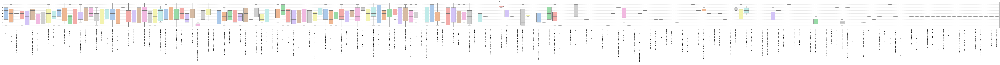

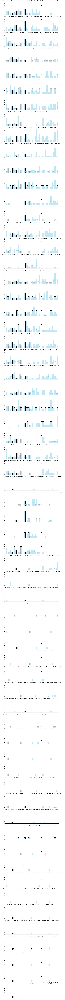

/tmp/ipython-input-17-2488750622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Rute', y=col, data=df, palette='pastel')
/tmp/ipython-input-17-2488750622.py:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


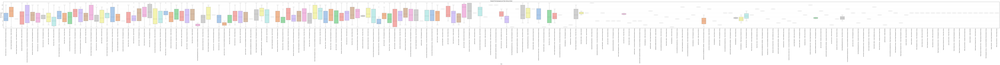

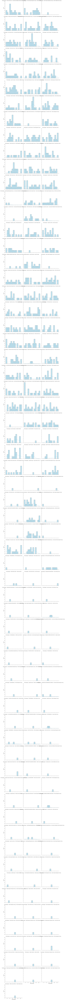

/tmp/ipython-input-17-2488750622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Rute', y=col, data=df, palette='pastel')
/tmp/ipython-input-17-2488750622.py:36: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


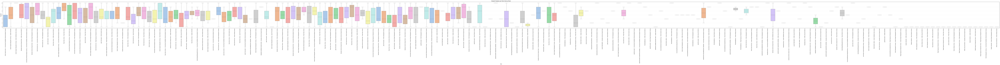

KeyboardInterrupt: 

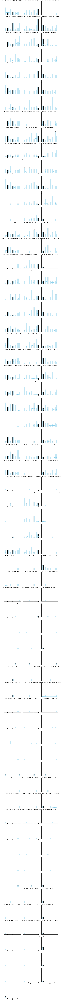

In [ ]:
# ===========================================
#  ANALISIS BOX PLOT & DISTRIBUSI PER RUTE
#  (MENAMPILKAN SEMUA RUTE)
# ===========================================

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

df.columns = df.columns.str.strip()
df['Rute'] = df['Lokasi_Asal'].astype(str).str.strip() + " → " + \
             df['Lokasi_Tujuan'].astype(str).str.strip()

num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(f"Kolom numerik ({len(num_cols)}):", num_cols)

show_histograms = True        # True = tampilkan hist+KDE per rute
wrap_cols       = 3           # berapa subplot per baris utk histogram

plt.figure(figsize=(2.5*len(num_cols), 6))
sns.boxplot(data=df[num_cols], orient='h', palette='Set2')
plt.title('Ringkasan Boxplot – Semua Fitur Numerik')
plt.grid(axis='x', linestyle='--', alpha=0.3)
plt.show()

all_routes = df['Rute'].unique()
print(f"Total rute unik: {len(all_routes)}")

for col in num_cols:
    plt.figure(figsize=(max(10, 1.2*len(all_routes)), 6))
    sns.boxplot(x='Rute', y=col, data=df, palette='pastel')
    plt.title(f'Boxplot {col} per Rute (Semua Rute)')
    plt.xticks(rotation=90)
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

    if show_histograms:
        g = sns.displot(
            data=df, x=col, col='Rute', col_wrap=wrap_cols,
            kde=True, color='skyblue', height=4, aspect=1.2
        )
        g.set_titles(col_template=f'{col} – {{col_name}}')
        g.set_axis_labels(col, 'Count')
        plt.tight_layout()
        plt.show()

print(" Selesai!  Visualisasi dibuat untuk semua rute dan", len(num_cols), "fitur numerik.")

In [ ]:
# REGRESI WAKTU_TEMPUH  –  XGBoost + Encoding & Scaling
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


df_model = df.copy()

categorical_cols = [
    'Cuaca', 'Kepadatan', 'Hari',
    'Klasifikasi_Tanjakan', 'Klasifikasi_Turunan',
    'Ada_Perbaikan_Jalan', 'Rute'
]

for col in categorical_cols:
    if col in df_model.columns:
        le = LabelEncoder()
        df_model[col] = le.fit_transform(df_model[col].astype(str))
    else:
        print(f" Kolom '{col}' tidak ditemukan & dilewati.")

drop_cols = ['Lokasi_Asal', 'Lokasi_Tujuan',
             'Koordinat_Asal', 'Koordinat_Tujuan']
df_model = df_model.drop(columns=[c for c in drop_cols if c in df_model.columns])

target_col = 'Waktu_Tempuh'
if target_col not in df_model.columns:
    raise KeyError(f"Kolom target '{target_col}' tidak ditemukan!")

X = df_model.drop(columns=[target_col])
y = df_model[target_col]

numeric_cols = X.select_dtypes(include=np.number).columns.tolist()
scaler = StandardScaler()
X[numeric_cols] = scaler.fit_transform(X[numeric_cols])

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, shuffle=True
)

model = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    objective='reg:squarederror'
)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mae  = mean_absolute_error(y_test, y_pred)
mse  = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2   = r2_score(y_test, y_pred)

print("  Pelatihan selesai!")
print(f" MAE  : {mae:.2f}")
print(f" MSE  : {mse:.2f}")
print(f" RMSE : {rmse:.2f}")
print(f" R²   : {r2:.4f}")

comparison_df = pd.DataFrame({
    "Nilai_Asli": y_test.reset_index(drop=True),
    "Prediksi"  : y_pred
})
print("\n📋 Contoh perbandingan:")
print(comparison_df.head(10))

plt.figure(figsize=(10,5))
plt.plot(comparison_df["Nilai_Asli"].values, label="Nilai Asli", marker='o')
plt.plot(comparison_df["Prediksi"].values,  label="Prediksi",   marker='x', linestyle='--')
plt.title("Prediksi vs Nilai Asli")
plt.xlabel("Index")
plt.ylabel("Waktu Tempuh")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
#  PREDIKSI WAKTU TEMPUH  + GOOGLE MAPS LINK

import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from urllib.parse import quote_plus

df_pred = df.copy()

df_pred['Lokasi_Asal'] = df_pred['Lokasi_Asal'].replace({
    'Universitas Pendidikan Muhammadiyah Sorong': 'UNIMUDA Sorong'
})
df_pred['Lokasi_Tujuan'] = df_pred['Lokasi_Tujuan'].replace({
    'Universitas Pendidikan Muhammadiyah Sorong': 'UNIMUDA Sorong'
})
lokasi_asal = df_pred['Lokasi_Asal'].str.strip()
lokasi_tujuan = df_pred['Lokasi_Tujuan'].str.strip()

categorical_cols = [
    'Cuaca', 'Kepadatan', 'Hari',
    'Ada_Perbaikan_Jalan', 'Klasifikasi_Tanjakan', 'Klasifikasi_Turunan', 'Rute'
]

for col in categorical_cols:
    if col in df_pred.columns:
        le = LabelEncoder()
        df_pred[col] = le.fit_transform(df_pred[col].astype(str))

drop_cols = ['Lokasi_Asal', 'Lokasi_Tujuan', 'Koordinat_Asal', 'Koordinat_Tujuan', 'Waktu_Tempuh']
X_pred = df_pred.drop(columns=[c for c in drop_cols if c in df_pred.columns])

numeric_cols = X_pred.select_dtypes(include=np.number).columns
scaler = StandardScaler()
X_pred[numeric_cols] = scaler.fit_transform(X_pred[numeric_cols])

y_pred_all = model.predict(X_pred)

def make_maps_url(asal, tujuan):
    return f"https://www.google.com/maps/dir/?api=1&origin={quote_plus(asal)}&destination={quote_plus(tujuan)}"

result_df = pd.DataFrame({
    "Lokasi Asal": lokasi_asal,
    "Lokasi Tujuan": lokasi_tujuan,
    "Prediksi Waktu Tempuh (menit)": np.round(y_pred_all, 2)
})
result_df["Google Maps"] = result_df.apply(lambda r: make_maps_url(r["Lokasi Asal"], r["Lokasi Tujuan"]), axis=1)

pd.set_option("display.max_rows", None)
pd.set_option("display.max_colwidth", None)
print("📄 Seluruh hasil prediksi:")
print(result_df.to_string(index=False))

excel_path = "/content/drive/My Drive/PrediksiWaktu/hasil_prediksi_lengkap.xlsx"
csv_path = "/content/drive/My Drive/PrediksiWaktu/hasil_prediksi_lengkap.csv"
result_df.to_excel(excel_path, index=False)
result_df.to_csv(csv_path, index=False)


In [ ]:
import joblib

# Misal model Anda bernama `model`
joblib.dump(model, 'xgboost_model.pkl')


NameError: name 'model' is not defined

In [ ]:
import joblib

joblib.dump(model, 'xgboost_model.pkl')
joblib.dump(le_dict, 'le_dict.pkl')

NameError: name 'model' is not defined